# Verification that the bspline actually corrects a perturbed contour

-- Kind of works, but seems fairly fragile. It is bossible that using an ML model to learn the bspline parameters would work better, but I'm not sure

In [1]:
%load_ext autoreload
%autoreload 2

%matplotlib inline

In [16]:
import numpy as np
import logging
import sys
from pathlib import Path
import torch
from IPython.display import display

import matplotlib.pyplot as plt
import diffmeshopt.opt2d.hyperparameter_search as hps
from diffmeshopt.opt2d.hyperparameter_search import ExperimentRunner
import diffmeshopt.opt2d.evaluation as evaluation
from diffmeshopt.opt2d import vis
from pprint import pprint
import diffmeshopt.opt2d.debug as debug
import diffmeshopt.opt2d.trainer as trainer_module


debug.DEBUG = True

# Configure logging to stdout
logging.basicConfig(
    level=logging.INFO,
    format="%(asctime)s - %(levelname)s - %(message)s",
    handlers=[logging.StreamHandler(sys.stdout)],
)

In [3]:
# Define paths
dataset_path = "../data/2d_training_data_perturbations.pkl"  # Adjust if needed
output_dir = "../output/verification_test_5A/bspline/"
device = "cuda" if torch.cuda.is_available() else "cpu"

print(f"Using device: {device}")

Using device: cpu


In [4]:
def create_trainer_with_config(props_dict: dict, output_subdir_name: str):
    # Initialize Runner
    runner = ExperimentRunner(dataset_path, output_dir, device=device)

    refiner_props, template_props, t_mode = runner._build_props(props_dict)
    print("Default params:")
    pprint(refiner_props)

    init_contour = runner.dataset["shrink_5_perturb_3"]["contour"]
    image = runner.dataset["shrink_5_perturb_3"]["image"]

    # Calculating the contour before perturbation to use as ground truth for evaluation
    # Since the image for perturbed contour starts at a different row and column,
    # we need to adjust the contour coordinates accordingly
    unperturb_contour = runner.dataset["original"]["contour"]
    gt_contour = unperturb_contour.copy()  # Assuming the ground truth is the unperturbed contour
    gt_contour[:, 0] += (
        runner.dataset["original"]["row_start"] - runner.dataset["shrink_5_perturb_3"]["row_start"]
    )
    gt_contour[:, 1] += (
        runner.dataset["original"]["col_start"] - runner.dataset["shrink_5_perturb_3"]["col_start"]
    )

    # Prepare Tensors
    image_t = torch.from_numpy(image).float().to(runner.device)
    contour_t = torch.from_numpy(init_contour).float().to(runner.device)
    gt_contour_t = torch.from_numpy(gt_contour).float().to(runner.device)

    print("Computing contour metrics between ground truth and initial contour...")
    pprint(evaluation.compute_contour_metrics(gt_contour_t, contour_t))

    template_model = hps.TemplateModelFactory.create(
        t_mode,
        template_props,
        num_vertices=len(init_contour),
        image_shape=image.shape,
    ).to(runner.device)

    # run_dir = runner.output_dir / "cp_40_no_regs"
    run_dir = runner.output_dir / output_subdir_name
    refiner = hps.BSplineContourRefiner(
        contour_t,
        refiner_props,
        template_model,
    )
    refiner.to(runner.device)

    config = hps.TrainerConfig(
        output_dir=run_dir,
        image=image,
        gt_contour=gt_contour,
        max_steps=50000,
        save_interval=2000,  # Only save at end
        log_interval=100,
        use_tensorboard=False,  # Disable TB to save IO
        save_images=True,
        enable_progress_bar=True,  # Disable progress bar for parallel runs
    )

    trainer = hps.OptimizationTrainer(refiner, config)
    return (
        trainer,
        run_dir,
        refiner_props,
        template_props,
        t_mode,
        image,
        init_contour,
        gt_contour,
        image_t,
        contour_t,
        gt_contour_t,
    )

### Result: 40 control points with shape smoothing but no other regularization

Seems to work ok? But not perfect --- the lower left corner has area where the fit is not working. Check results from two random seeds

In [91]:
generator = debug.get_generator(device=device, manual_seed=1234)

In [92]:
### First test is without the tangential and normal laplacian
props_dict = {
    "trial_id": "verify_5A",
    "refiner": "bspline",
    "template": "bspline",
    "symmetric": True,
    "reg_mode": "static",
    "w_laplacian": 0.0,
    "w_edge": 0.0,
    "w_normal": 0,
    "w_tangential": 0,
    "w_anchor": 0.0,
    "w_smooth_param": 0.5,
    "w_contour_anchor": 0.0,
    "shape_loss_weight": 0.1,
    "learning_rate": 1e-1,
    "smoothness_window_size": 5,
    "min_peak_ratio": 3.0,
    "num_cp": 40,
}


In [93]:
(
    trainer,
    run_dir,
    refiner_props,
    template_props,
    t_mode,
    image,
    init_contour,
    gt_contour,
    image_t,
    contour_t,
    gt_contour_t,
) = create_trainer_with_config(props_dict=props_dict, output_subdir_name="cp_40_no_regs")

2026-07-15 16:09:48,927 - INFO - Loading dataset from ../data/2d_training_data_perturbations.pkl
2026-07-15 16:09:48,929 - INFO - Used params: ['learning_rate', 'min_peak_ratio', 'num_cp', 'refiner', 'reg_mode', 'shape_loss_weight', 'smoothness_window_size', 'symmetric', 'template', 'trial_id', 'w_anchor', 'w_contour_anchor', 'w_edge', 'w_laplacian', 'w_normal', 'w_smooth_param', 'w_tangential']
2026-07-15 16:09:48,929 - INFO - Unused params: []
2026-07-15 16:09:48,932 - INFO - Creating template model: bspline
2026-07-15 16:09:48,933 - INFO - Initializing ContourLoss
2026-07-15 16:09:48,935 - INFO - Initializing BSplineContourRefiner with 40 control points, 1237 eval points.
2026-07-15 16:09:48,936 - INFO - Output directory set to: ../output/verification_test_5A/bspline/cp_40_no_regs/2026-07-15_16-09-48
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/Users/saugat/code/diffmeshopt/.venv/lib/python3.14/site-packages/lightning/pytorch/trainer/setup.py:175:

Default params:
BSplineContourRefinerProps(num_steps=2000,
                           learning_rate=0.1,
                           initial_regularization_weights={'anchor_amp_ratio': 0.0,
                                                           'anchor_sigma_ratio': 0.0,
                                                           'contour_anchor': 0.0,
                                                           'contour_laplacian': 0.0,
                                                           'edge_length': 0.0,
                                                           'normal_consistency': 0,
                                                           'smooth_amp_ratio': 0.5,
                                                           'smooth_peak_dist': 0.5,
                                                           'smooth_sigma': 0.5,
                                                           'smooth_sigma_ratio': 0.5,
                                                           't

In [94]:
trainer.fit(20000)

2026-07-15 16:10:08,551 - INFO - Starting fit for 20000 steps.
/Users/saugat/code/diffmeshopt/.venv/lib/python3.14/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:881: Checkpoint directory /Users/saugat/code/diffmeshopt/output/verification_test_5A/bspline/cp_40_no_regs/2026-07-15_16-09-48 exists and is not empty.
/Users/saugat/code/diffmeshopt/.venv/lib/python3.14/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.


2026-07-15 16:11:38,417 - INFO - Final state saved to ../output/verification_test_5A/bspline/cp_40_no_regs/2026-07-15_16-09-48/final.pkl


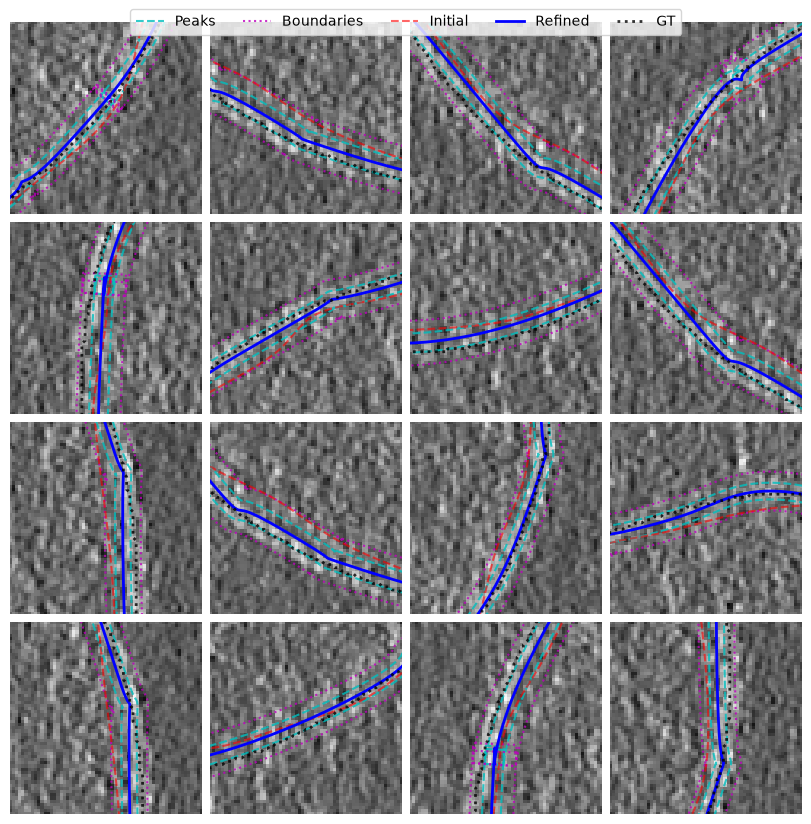

In [95]:
trainer.plot_image()

In [96]:
trainer.trainer.logger.history[-1]

{'step': 19999,
 'data_loss': 0.5176141858100891,
 'correlation_loss': 0.49168848991394043,
 'shape_loss': 0.02592567540705204,
 'contour_laplacian_loss': 0.0,
 'edge_length_loss': 0.0,
 'tangential_laplacian_loss': 0.0,
 'normal_consistency_loss': 0.0,
 'contour_anchor_loss': 0.0,
 'anchor_sigma_loss': 0.0,
 'anchor_peak_dist_loss': 0.0,
 'anchor_sigma_ratio_loss': 0.0,
 'anchor_amp_ratio_loss': 0.0,
 'smooth_sigma_loss': 0.0011274832068011165,
 'smooth_peak_dist_loss': 1.2232703738845885e-10,
 'smooth_sigma_ratio_loss': 0.0,
 'smooth_amp_ratio_loss': 0.0,
 'rbf_weight_decay_loss': 0.0,
 'total_loss': 0.5187416672706604,
 'mean_dist': 1.7402316331863403,
 'epoch': 0}

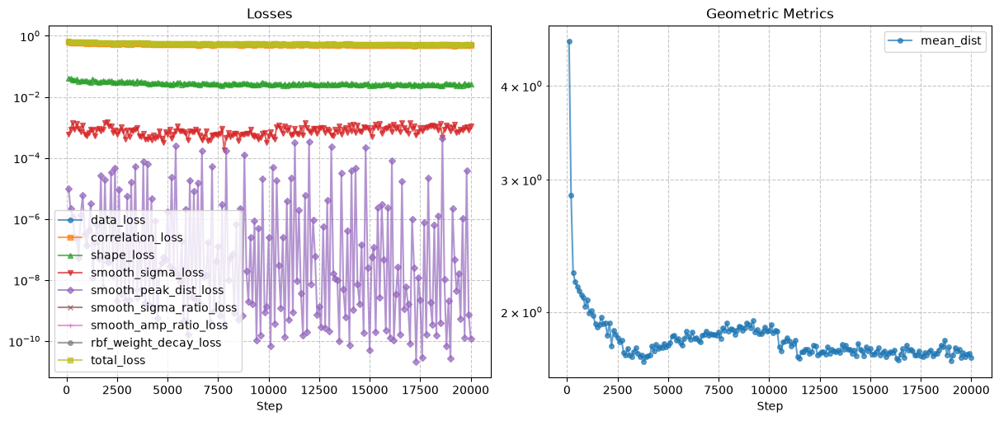

In [97]:
trainer.plot_metrics()

In [98]:
# Evaluate
final_contour = trainer.refiner.contour.detach().cpu().numpy()

# Check for NaNs or explosion
if np.isnan(final_contour).any() or np.max(np.abs(final_contour)) > max(image.shape) * 2:
    chamfer = np.inf


metrics_from_init = hps.compute_contour_metrics(trainer.refiner.contour, contour_t)
chamfer_from_init = metrics_from_init["mean_dist"]

In [99]:
chamfer_from_init

3.12570858001709

In [100]:
tmp_coords = trainer.refiner.contour
tmp_coords = tmp_coords.detach().cpu()
template_params = trainer.refiner.template_model.get_params(coordinates=tmp_coords)
(
    template_params["peak_dist"].mean(),
    template_params["peak_dist"].std(),
    template_params["sigma1"].mean(),
    template_params["sigma1"].std(),
)


(tensor(5.4019, grad_fn=<MeanBackward0>),
 tensor(0.5412, grad_fn=<StdBackward0>),
 tensor(1.8005, grad_fn=<MeanBackward0>),
 tensor(0.1804, grad_fn=<StdBackward0>))

Mean Peak Dist: 5.40, Mean Sigma1: 1.80, Mean Sigma2: 1.80
Original Peak Dist: 4.0 Original Sigma1: 0.75


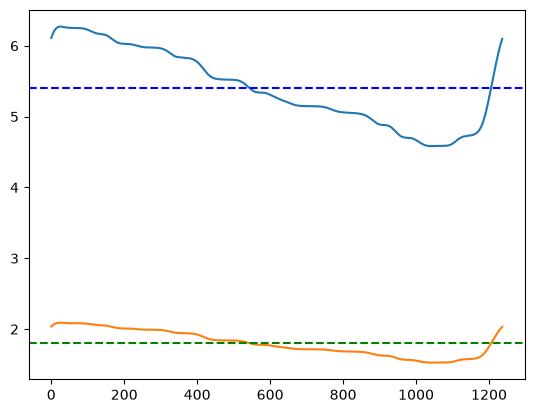

In [101]:
mean_peak_dist = template_params["peak_dist"].detach().numpy().mean()
mean_sigma1 = template_params["sigma1"].detach().numpy().mean()
mean_sigma2 = template_params["sigma2"].detach().numpy().mean()

print(
    f"Mean Peak Dist: {mean_peak_dist:.2f}, Mean Sigma1: {mean_sigma1:.2f}, Mean Sigma2: {mean_sigma2:.2f}"
)
print(f"Original Peak Dist: {template_props.peak_dist} Original Sigma1: {template_props.sigma}")

plt.plot(template_params["peak_dist"].detach().numpy())
plt.plot(template_params["sigma1"].detach().numpy())
plt.axhline(
    y=mean_peak_dist,
    color="b",
    linestyle="dashed",
)
plt.axhline(
    y=mean_sigma1,
    color="g",
    linestyle="dashed",
)
plt.show()

In [102]:
tmp_profiles, *_ = trainer.refiner.sample_image_features(image_t)
tmp_profiles = tmp_profiles.detach()

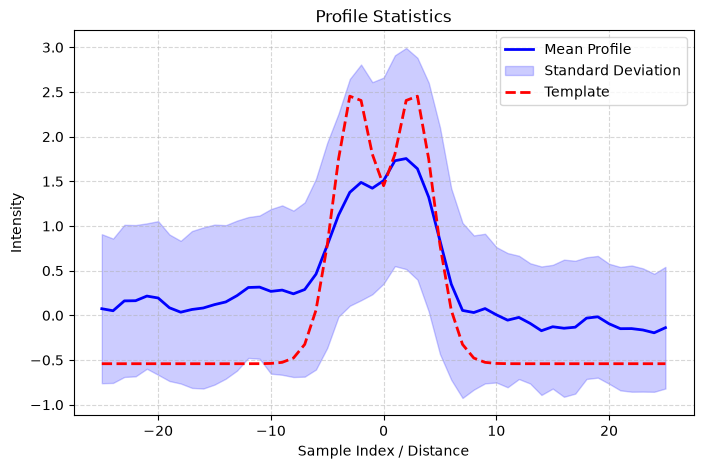

In [104]:
trainer.refiner.visualize_profile_statistics(image_t.cpu())


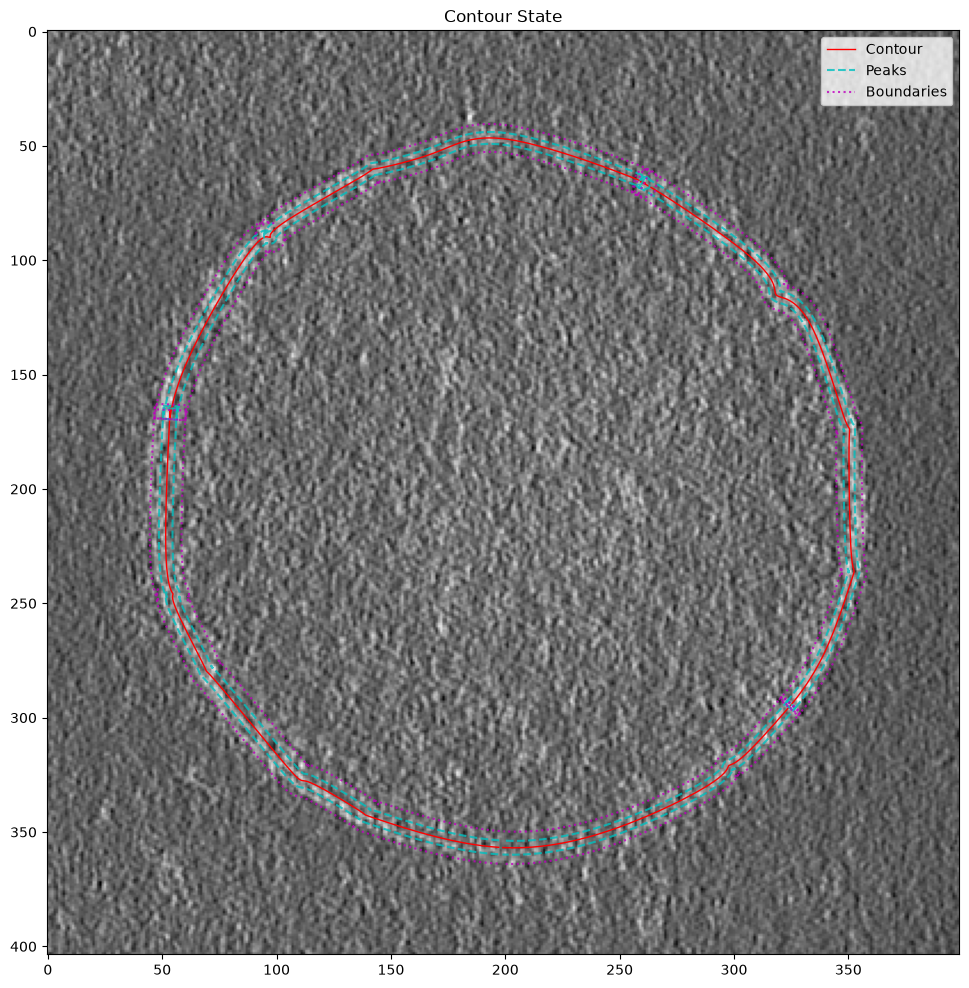

In [105]:
trainer.refiner.visualize_contour(image_t.detach())

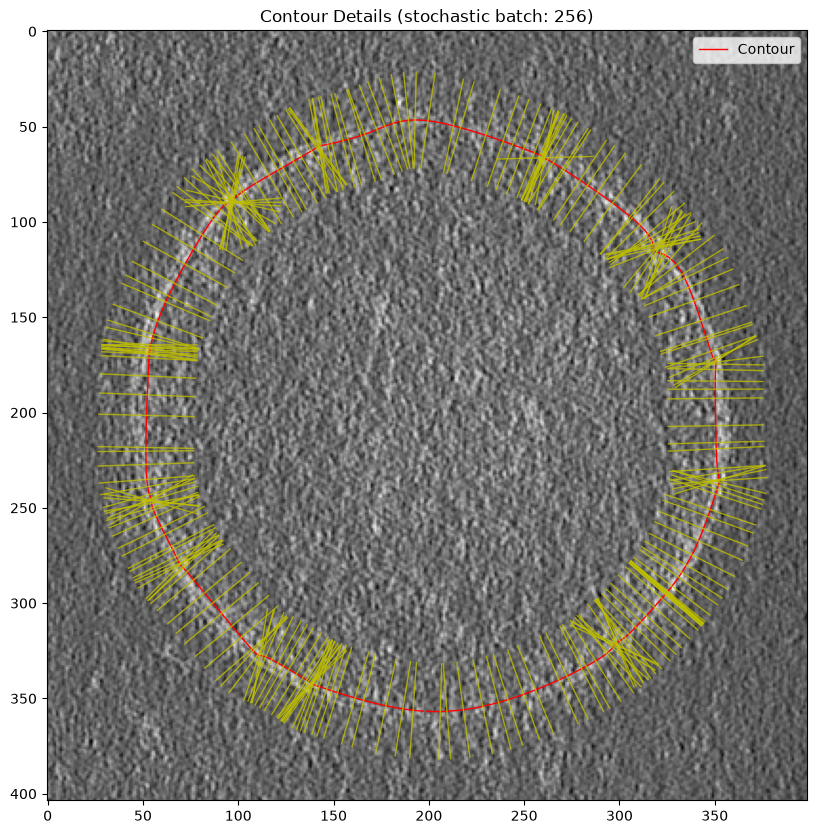

In [106]:
vis.plot_contour_normals(image_t, tmp_coords.detach().numpy())

#### Next random seed

2026-07-15 16:29:33,893 - INFO - Resetting generator.
2026-07-15 16:29:33,894 - INFO - Creating new generator with seed 12345 on device cpu.
2026-07-15 16:29:33,895 - INFO - Loading dataset from ../data/2d_training_data_perturbations.pkl
2026-07-15 16:29:33,896 - INFO - Used params: ['learning_rate', 'min_peak_ratio', 'num_cp', 'refiner', 'reg_mode', 'shape_loss_weight', 'smoothness_window_size', 'symmetric', 'template', 'trial_id', 'w_anchor', 'w_contour_anchor', 'w_edge', 'w_laplacian', 'w_normal', 'w_smooth_param', 'w_tangential']
2026-07-15 16:29:33,897 - INFO - Unused params: []
2026-07-15 16:29:33,899 - INFO - Creating template model: bspline
2026-07-15 16:29:33,899 - INFO - Initializing ContourLoss
2026-07-15 16:29:33,900 - INFO - Initializing BSplineContourRefiner with 40 control points, 1237 eval points.
2026-07-15 16:29:33,902 - INFO - Output directory set to: ../output/verification_test_5A/bspline/cp_40_no_regs/2026-07-15_16-29-33
GPU available: True (mps), used: False
TPU a

Default params:
BSplineContourRefinerProps(num_steps=2000,
                           learning_rate=0.1,
                           initial_regularization_weights={'anchor_amp_ratio': 0.0,
                                                           'anchor_sigma_ratio': 0.0,
                                                           'contour_anchor': 0.0,
                                                           'contour_laplacian': 0.0,
                                                           'edge_length': 0.0,
                                                           'normal_consistency': 0,
                                                           'smooth_amp_ratio': 0.5,
                                                           'smooth_peak_dist': 0.5,
                                                           'smooth_sigma': 0.5,
                                                           'smooth_sigma_ratio': 0.5,
                                                           't

2026-07-15 16:31:02,891 - INFO - Final state saved to ../output/verification_test_5A/bspline/cp_40_no_regs/2026-07-15_16-29-33/final.pkl


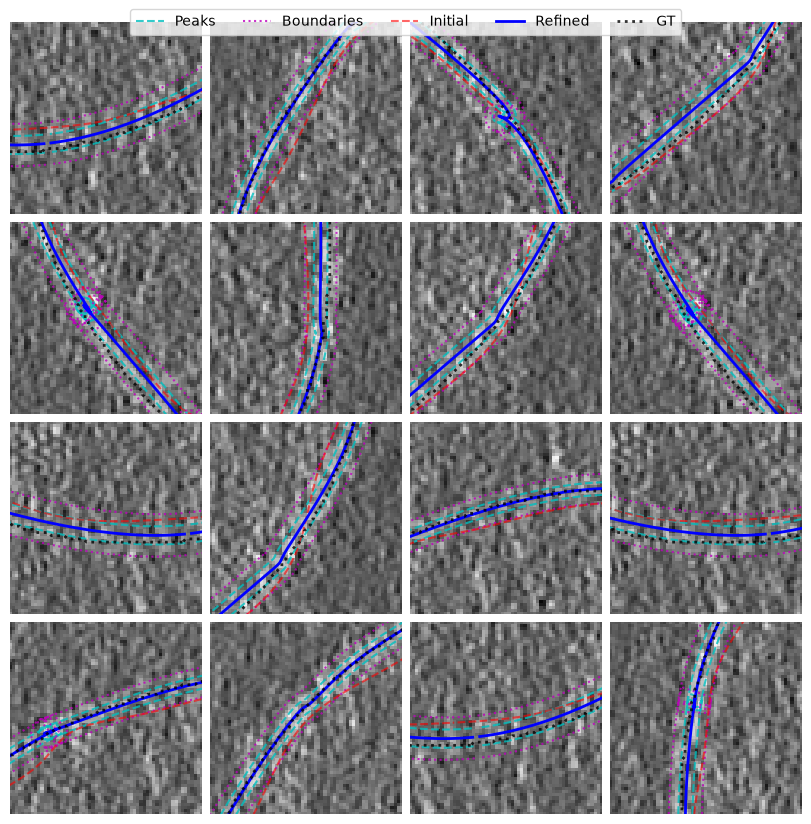

{'anchor_amp_ratio_loss': 0.0,
 'anchor_peak_dist_loss': 0.0,
 'anchor_sigma_loss': 0.0,
 'anchor_sigma_ratio_loss': 0.0,
 'contour_anchor_loss': 0.0,
 'contour_laplacian_loss': 0.0,
 'correlation_loss': 0.4670482575893402,
 'data_loss': 0.4912067651748657,
 'edge_length_loss': 0.0,
 'epoch': 0,
 'mean_dist': 1.3438538312911987,
 'normal_consistency_loss': 0.0,
 'rbf_weight_decay_loss': 0.0,
 'shape_loss': 0.024158522486686707,
 'smooth_amp_ratio_loss': 0.0,
 'smooth_peak_dist_loss': 1.5132980979437605e-10,
 'smooth_sigma_loss': 0.003267980646342039,
 'smooth_sigma_ratio_loss': 0.0,
 'step': 19999,
 'tangential_laplacian_loss': 0.0,
 'total_loss': 0.49447473883628845}
Chamfer from init 3.81941556930542
Mean Peak Dist: 4.54, Mean Sigma1: 1.51, Mean Sigma2: 1.51
Original Peak Dist: 4.0 Original Sigma1: 0.75


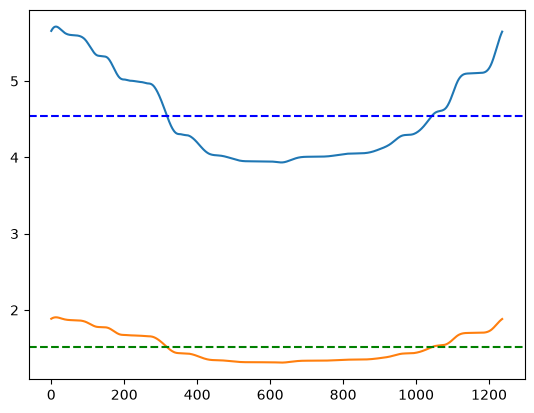

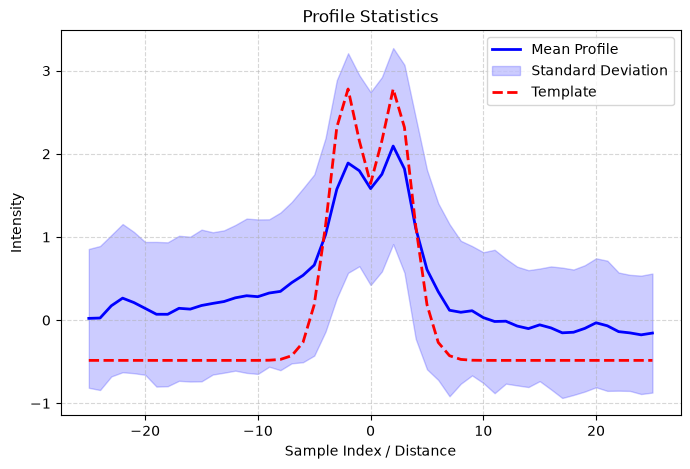

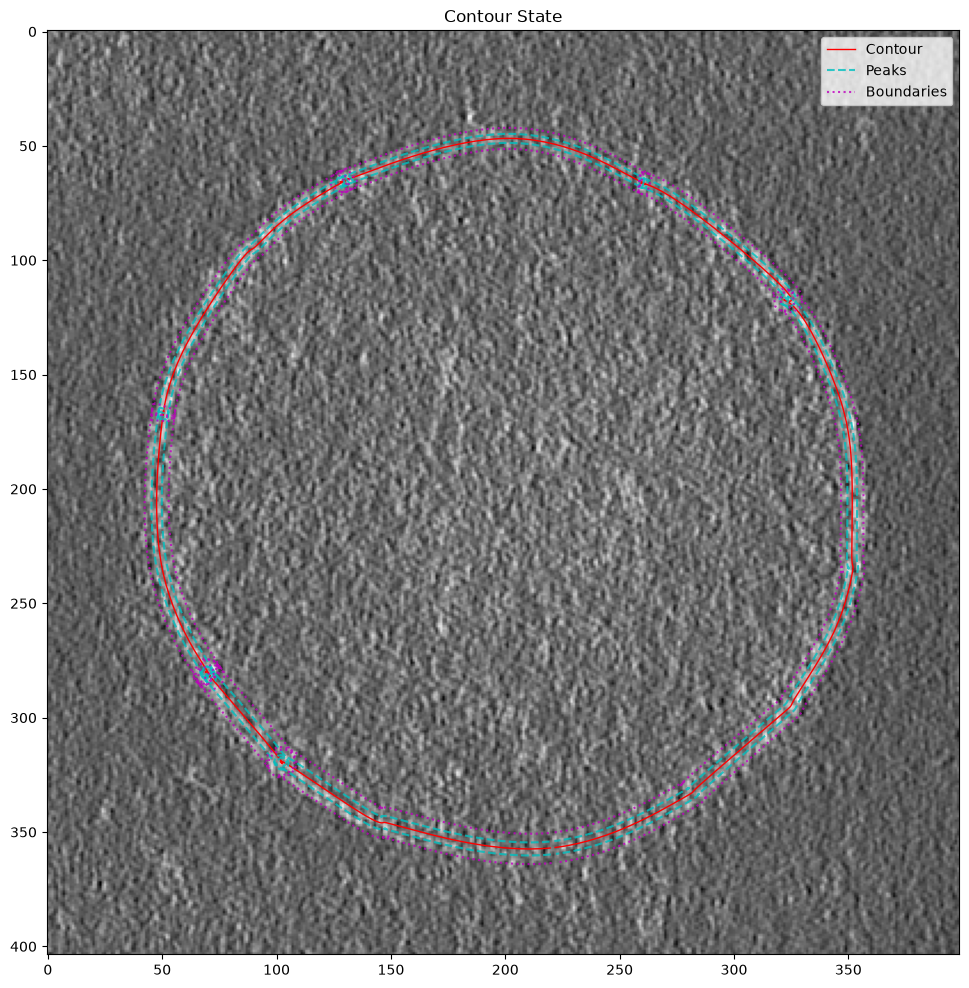

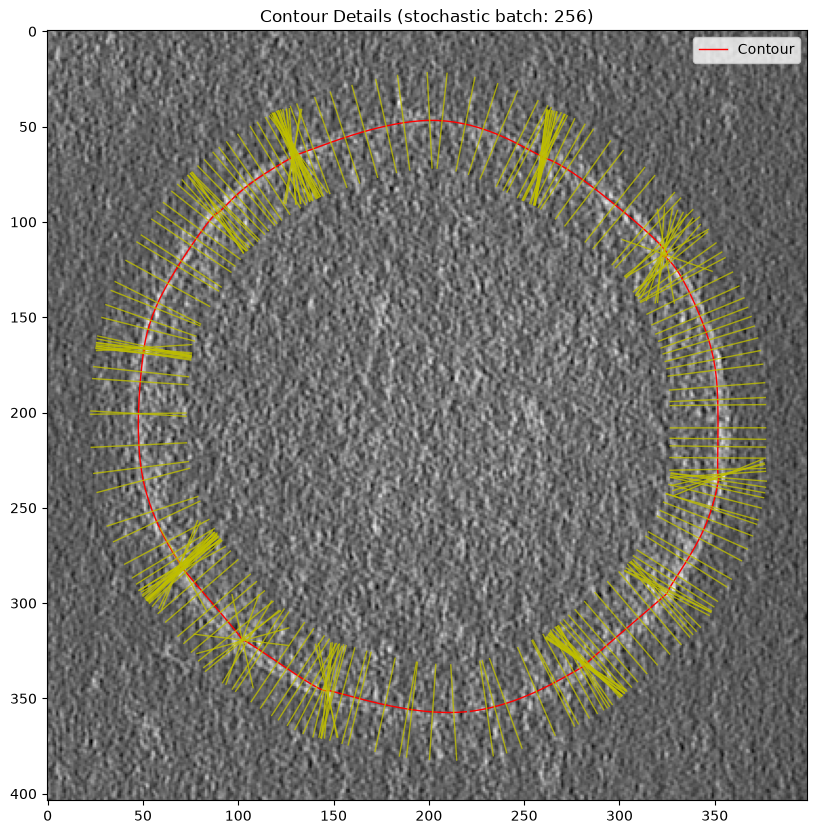

In [121]:
generator = debug.get_generator(device=device, manual_seed=12345, reset=True)
### First test is without the tangential and normal laplacian
props_dict = {
    "trial_id": "verify_5A",
    "refiner": "bspline",
    "template": "bspline",
    "symmetric": True,
    "reg_mode": "static",
    "w_laplacian": 0.0,
    "w_edge": 0.0,
    "w_normal": 0,
    "w_tangential": 0,
    "w_anchor": 0.0,
    "w_smooth_param": 0.5,
    "w_contour_anchor": 0.0,
    "shape_loss_weight": 0.1,
    "learning_rate": 1e-1,
    "smoothness_window_size": 5,
    "min_peak_ratio": 3.0,
    "num_cp": 40,
}

(
    trainer,
    run_dir,
    refiner_props,
    template_props,
    t_mode,
    image,
    init_contour,
    gt_contour,
    image_t,
    contour_t,
    gt_contour_t,
) = create_trainer_with_config(props_dict=props_dict, output_subdir_name="cp_40_no_regs")
trainer.fit(20000)
cb = next(
    (c for c in trainer.trainer.callbacks if isinstance(c, trainer_module.ImageLoggerCallback)),
    None,
)
if cb:
    fig = cb.create_figure(trainer.model)
# trainer.plot_image()
plt.show()

pprint(trainer.trainer.logger.history[-1])
trainer.plot_metrics()
plt.show()
# Evaluate
final_contour = trainer.refiner.contour.detach().cpu().numpy()

# Check for NaNs or explosion
if np.isnan(final_contour).any() or np.max(np.abs(final_contour)) > max(image.shape) * 2:
    chamfer = np.inf


metrics_from_init = hps.compute_contour_metrics(trainer.refiner.contour, contour_t)
chamfer_from_init = metrics_from_init["mean_dist"]
print("Chamfer from init", chamfer_from_init)
tmp_coords = trainer.refiner.contour
tmp_coords = tmp_coords.detach().cpu()
template_params = trainer.refiner.template_model.get_params(coordinates=tmp_coords)
(
    template_params["peak_dist"].mean(),
    template_params["peak_dist"].std(),
    template_params["sigma1"].mean(),
    template_params["sigma1"].std(),
)

mean_peak_dist = template_params["peak_dist"].detach().numpy().mean()
mean_sigma1 = template_params["sigma1"].detach().numpy().mean()
mean_sigma2 = template_params["sigma2"].detach().numpy().mean()

print(
    f"Mean Peak Dist: {mean_peak_dist:.2f}, Mean Sigma1: {mean_sigma1:.2f}, Mean Sigma2: {mean_sigma2:.2f}"
)
print(f"Original Peak Dist: {template_props.peak_dist} Original Sigma1: {template_props.sigma}")

plt.plot(template_params["peak_dist"].detach().numpy())
plt.plot(template_params["sigma1"].detach().numpy())
plt.axhline(
    y=mean_peak_dist,
    color="b",
    linestyle="dashed",
)
plt.axhline(
    y=mean_sigma1,
    color="g",
    linestyle="dashed",
)
plt.show()
tmp_profiles, *_ = trainer.refiner.sample_image_features(image_t)
tmp_profiles = tmp_profiles.detach()
trainer.refiner.visualize_profile_statistics(image_t.cpu())
plt.show()
trainer.refiner.visualize_contour(image_t.detach())
vis.plot_contour_normals(image_t, tmp_coords.detach().numpy())
plt.show()

2026-07-15 16:42:19,759 - INFO - Resetting generator.
2026-07-15 16:42:19,760 - INFO - Creating new generator with seed 1234 on device cpu.
2026-07-15 16:42:19,761 - INFO - Loading dataset from ../data/2d_training_data_perturbations.pkl
2026-07-15 16:42:19,763 - INFO - Used params: ['learning_rate', 'min_peak_ratio', 'num_cp', 'refiner', 'reg_mode', 'shape_loss_weight', 'smoothness_window_size', 'symmetric', 'template', 'trial_id', 'w_anchor', 'w_contour_anchor', 'w_edge', 'w_laplacian', 'w_normal', 'w_smooth_param', 'w_tangential']
2026-07-15 16:42:19,764 - INFO - Unused params: []
2026-07-15 16:42:19,766 - INFO - Creating template model: bspline
2026-07-15 16:42:19,767 - INFO - Initializing ContourLoss
2026-07-15 16:42:19,767 - INFO - Initializing BSplineContourRefiner with 60 control points, 1237 eval points.
2026-07-15 16:42:19,769 - INFO - Output directory set to: ../output/verification_test_5A/bspline/cp_60_no_regs/2026-07-15_16-42-19
GPU available: True (mps), used: False
TPU av

Default params:
BSplineContourRefinerProps(num_steps=2000,
                           learning_rate=0.1,
                           initial_regularization_weights={'anchor_amp_ratio': 0.0,
                                                           'anchor_sigma_ratio': 0.0,
                                                           'contour_anchor': 0.0,
                                                           'contour_laplacian': 0.0,
                                                           'edge_length': 0.0,
                                                           'normal_consistency': 0,
                                                           'smooth_amp_ratio': 0.5,
                                                           'smooth_peak_dist': 0.5,
                                                           'smooth_sigma': 0.5,
                                                           'smooth_sigma_ratio': 0.5,
                                                           't

2026-07-15 16:43:49,851 - INFO - Final state saved to ../output/verification_test_5A/bspline/cp_60_no_regs/2026-07-15_16-42-19/final.pkl


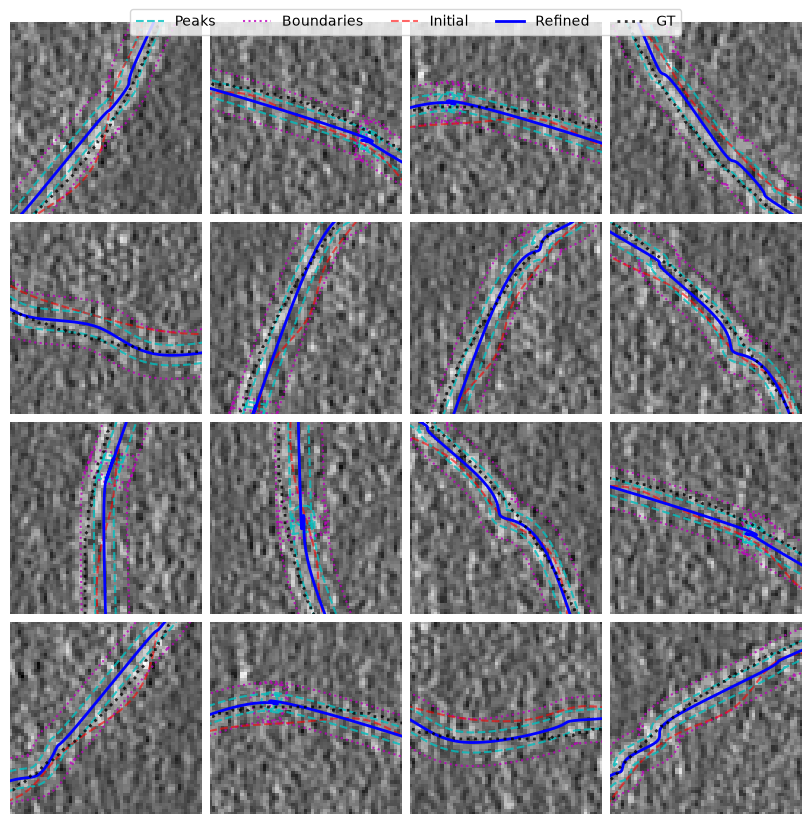

{'anchor_amp_ratio_loss': 0.0,
 'anchor_peak_dist_loss': 0.0,
 'anchor_sigma_loss': 0.0,
 'anchor_sigma_ratio_loss': 0.0,
 'contour_anchor_loss': 0.0,
 'contour_laplacian_loss': 0.0,
 'correlation_loss': 0.47957807779312134,
 'data_loss': 0.5027952790260315,
 'edge_length_loss': 0.0,
 'epoch': 0,
 'mean_dist': 2.1916003227233887,
 'normal_consistency_loss': 0.0,
 'rbf_weight_decay_loss': 0.0,
 'shape_loss': 0.023217197507619858,
 'smooth_amp_ratio_loss': 0.0,
 'smooth_peak_dist_loss': 3.6953218796043075e-07,
 'smooth_sigma_loss': 0.0010161319514736533,
 'smooth_sigma_ratio_loss': 0.0,
 'step': 19999,
 'tangential_laplacian_loss': 0.0,
 'total_loss': 0.503811776638031}


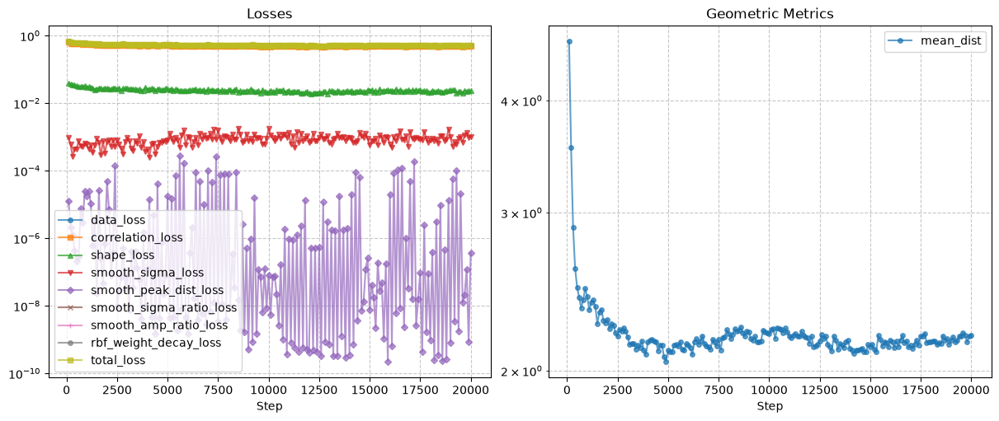

Chamfer from init 3.2343592643737793
Mean Peak Dist: 5.83, Mean Sigma1: 1.94, Mean Sigma2: 1.94
Original Peak Dist: 4.0 Original Sigma1: 0.75


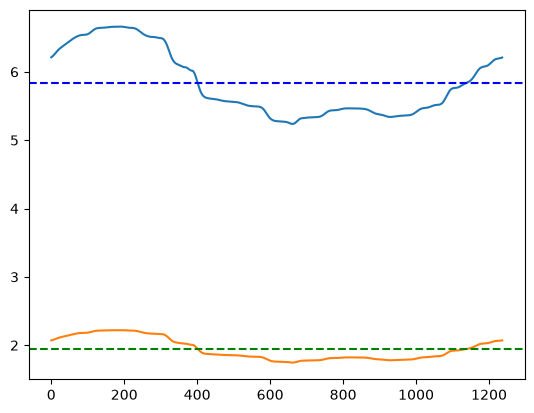

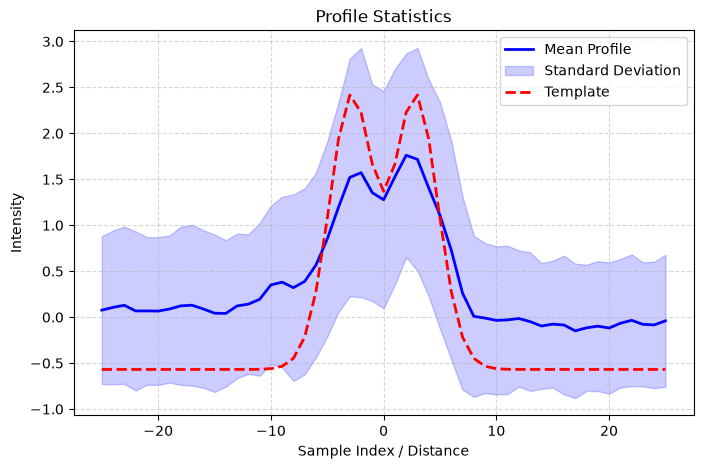

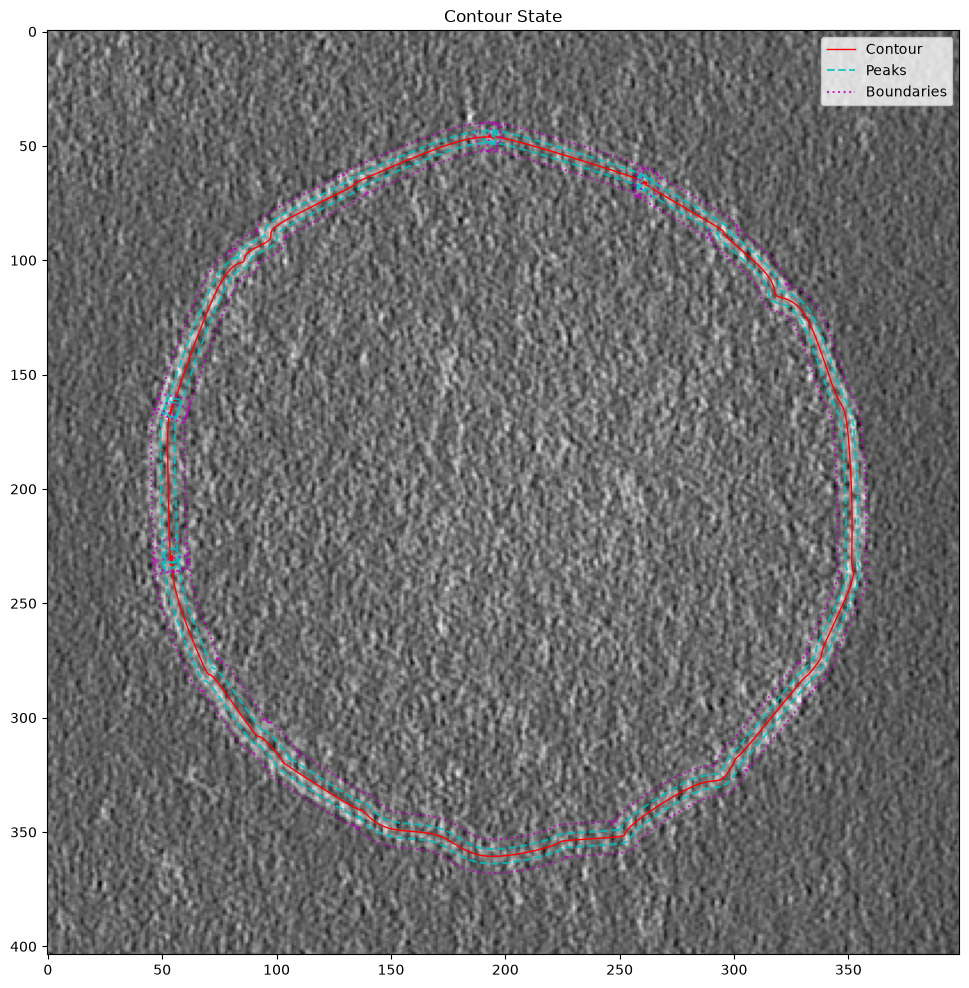

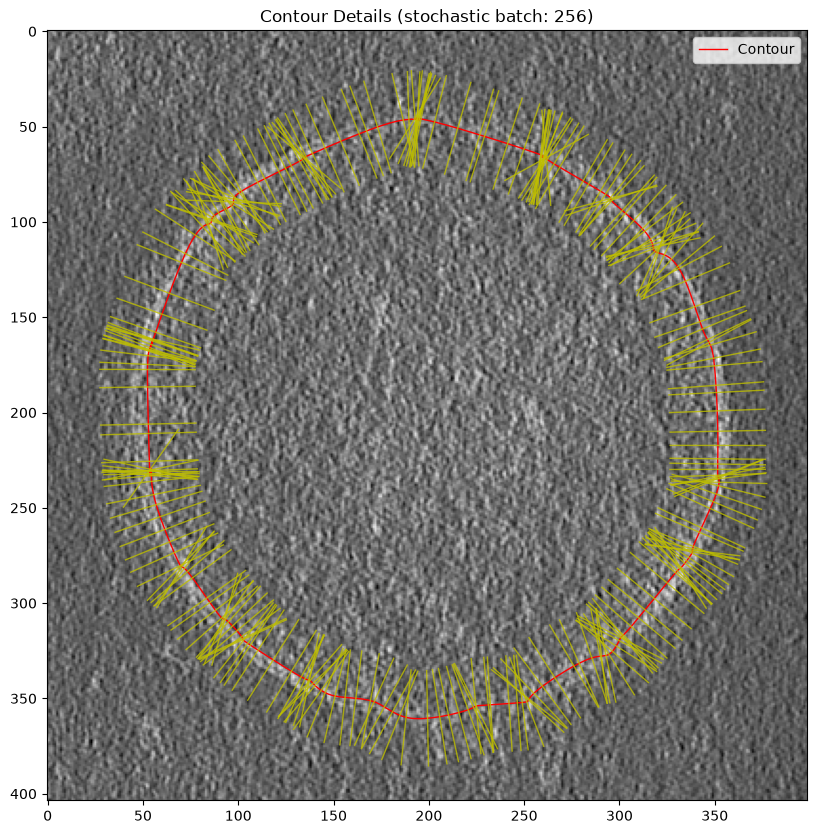

In [13]:
### Setting number of control points to 60, and no laplacian or normal regularization

#### Random seed 1234
generator = debug.get_generator(device=device, manual_seed=1234, reset=True)
### First test is without the tangential and normal laplacian
props_dict = {
    "trial_id": "verify_5A",
    "refiner": "bspline",
    "template": "bspline",
    "symmetric": True,
    "reg_mode": "static",
    "w_laplacian": 0.0,
    "w_edge": 0.0,
    "w_normal": 0,
    "w_tangential": 0,
    "w_anchor": 0.0,
    "w_smooth_param": 0.5,
    "w_contour_anchor": 0.0,
    "shape_loss_weight": 0.1,
    "learning_rate": 1e-1,
    "smoothness_window_size": 5,
    "min_peak_ratio": 3.0,
    "num_cp": 60,
}

(
    trainer,
    run_dir,
    refiner_props,
    template_props,
    t_mode,
    image,
    init_contour,
    gt_contour,
    image_t,
    contour_t,
    gt_contour_t,
) = create_trainer_with_config(props_dict=props_dict, output_subdir_name="cp_60_no_regs")
trainer.fit(20000)

display(trainer.plot_image())
pprint(trainer.trainer.logger.history[-1])
fig = trainer.plot_metrics()
display(fig)


# Evaluate
final_contour = trainer.refiner.contour.detach().cpu().numpy()

# Check for NaNs or explosion
if np.isnan(final_contour).any() or np.max(np.abs(final_contour)) > max(image.shape) * 2:
    chamfer = np.inf


metrics_from_init = hps.compute_contour_metrics(trainer.refiner.contour, contour_t)
chamfer_from_init = metrics_from_init["mean_dist"]
print("Chamfer from init", chamfer_from_init)
tmp_coords = trainer.refiner.contour
tmp_coords = tmp_coords.detach().cpu()
template_params = trainer.refiner.template_model.get_params(coordinates=tmp_coords)
(
    template_params["peak_dist"].mean(),
    template_params["peak_dist"].std(),
    template_params["sigma1"].mean(),
    template_params["sigma1"].std(),
)

mean_peak_dist = template_params["peak_dist"].detach().numpy().mean()
mean_sigma1 = template_params["sigma1"].detach().numpy().mean()
mean_sigma2 = template_params["sigma2"].detach().numpy().mean()

print(
    f"Mean Peak Dist: {mean_peak_dist:.2f}, Mean Sigma1: {mean_sigma1:.2f}, Mean Sigma2: {mean_sigma2:.2f}"
)
print(f"Original Peak Dist: {template_props.peak_dist} Original Sigma1: {template_props.sigma}")

plt.plot(template_params["peak_dist"].detach().numpy())
plt.plot(template_params["sigma1"].detach().numpy())
plt.axhline(
    y=mean_peak_dist,
    color="b",
    linestyle="dashed",
)
plt.axhline(
    y=mean_sigma1,
    color="g",
    linestyle="dashed",
)
plt.show()
tmp_profiles, *_ = trainer.refiner.sample_image_features(image_t)
tmp_profiles = tmp_profiles.detach()
trainer.refiner.visualize_profile_statistics(image_t.cpu())
plt.show()
trainer.refiner.visualize_contour(image_t.detach())
vis.plot_contour_normals(image_t, tmp_coords.detach().numpy())
plt.show()

#### Half of the fit is not very good

#### Next setting number of control points to 60, zero smoothing parameter


2026-07-15 16:46:17,823 - INFO - Resetting generator.
2026-07-15 16:46:17,824 - INFO - Creating new generator with seed 1234 on device cpu.
2026-07-15 16:46:17,824 - INFO - Loading dataset from ../data/2d_training_data_perturbations.pkl
2026-07-15 16:46:17,826 - INFO - Used params: ['learning_rate', 'min_peak_ratio', 'num_cp', 'refiner', 'reg_mode', 'shape_loss_weight', 'smoothness_window_size', 'symmetric', 'template', 'trial_id', 'w_anchor', 'w_contour_anchor', 'w_edge', 'w_laplacian', 'w_normal', 'w_smooth_param', 'w_tangential']
2026-07-15 16:46:17,826 - INFO - Unused params: []
2026-07-15 16:46:17,828 - INFO - Creating template model: bspline
2026-07-15 16:46:17,828 - INFO - Initializing ContourLoss
2026-07-15 16:46:17,829 - INFO - Initializing BSplineContourRefiner with 60 control points, 1237 eval points.
2026-07-15 16:46:17,831 - INFO - Output directory set to: ../output/verification_test_5A/bspline/cp_60_no_regs/2026-07-15_16-46-17
GPU available: True (mps), used: False
TPU av

Default params:
BSplineContourRefinerProps(num_steps=2000,
                           learning_rate=0.1,
                           initial_regularization_weights={'anchor_amp_ratio': 0.0,
                                                           'anchor_sigma_ratio': 0.0,
                                                           'contour_anchor': 0.0,
                                                           'contour_laplacian': 0.0,
                                                           'edge_length': 0.0,
                                                           'normal_consistency': 0,
                                                           'smooth_amp_ratio': 0.0,
                                                           'smooth_peak_dist': 0.0,
                                                           'smooth_sigma': 0.0,
                                                           'smooth_sigma_ratio': 0.0,
                                                           't

2026-07-15 16:47:48,274 - INFO - Final state saved to ../output/verification_test_5A/bspline/cp_60_no_regs/2026-07-15_16-46-17/final.pkl


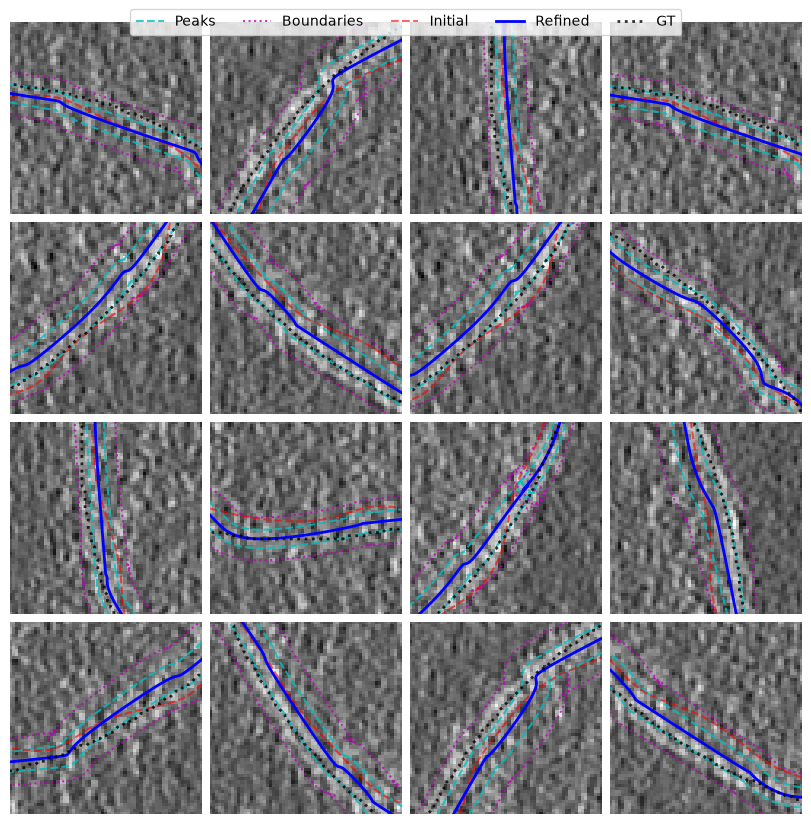

{'anchor_amp_ratio_loss': 0.0,
 'anchor_peak_dist_loss': 0.0,
 'anchor_sigma_loss': 0.0,
 'anchor_sigma_ratio_loss': 0.0,
 'contour_anchor_loss': 0.0,
 'contour_laplacian_loss': 0.0,
 'correlation_loss': 0.4903793931007385,
 'data_loss': 0.5155801177024841,
 'edge_length_loss': 0.0,
 'epoch': 0,
 'mean_dist': 2.8621344566345215,
 'normal_consistency_loss': 0.0,
 'rbf_weight_decay_loss': 0.0,
 'shape_loss': 0.025200730189681053,
 'smooth_amp_ratio_loss': 0.0,
 'smooth_peak_dist_loss': 0.0,
 'smooth_sigma_loss': 0.0,
 'smooth_sigma_ratio_loss': 0.0,
 'step': 19999,
 'tangential_laplacian_loss': 0.0,
 'total_loss': 0.5155801177024841}


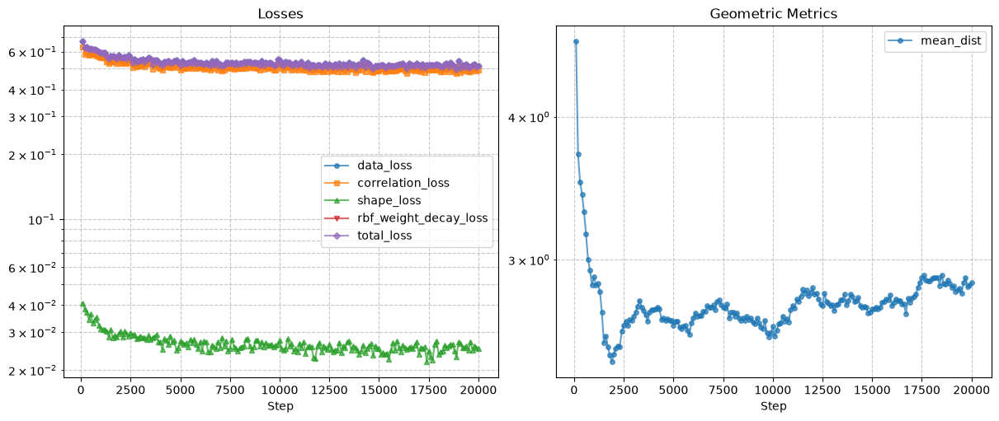

Chamfer from init 3.0251359939575195
Mean Peak Dist: 6.78, Mean Sigma1: 2.26, Mean Sigma2: 2.26
Original Peak Dist: 4.0 Original Sigma1: 0.75


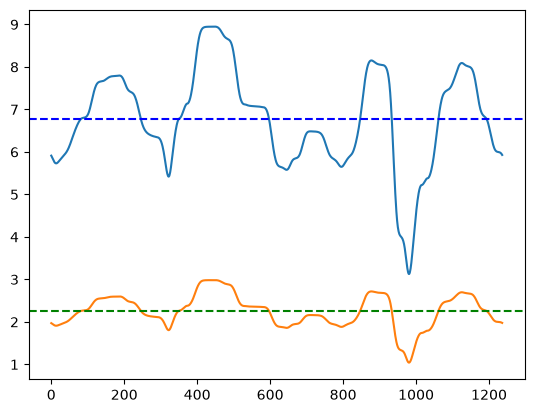

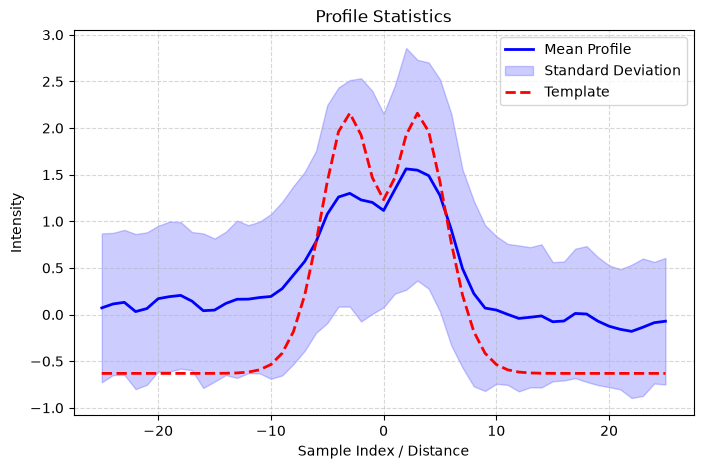

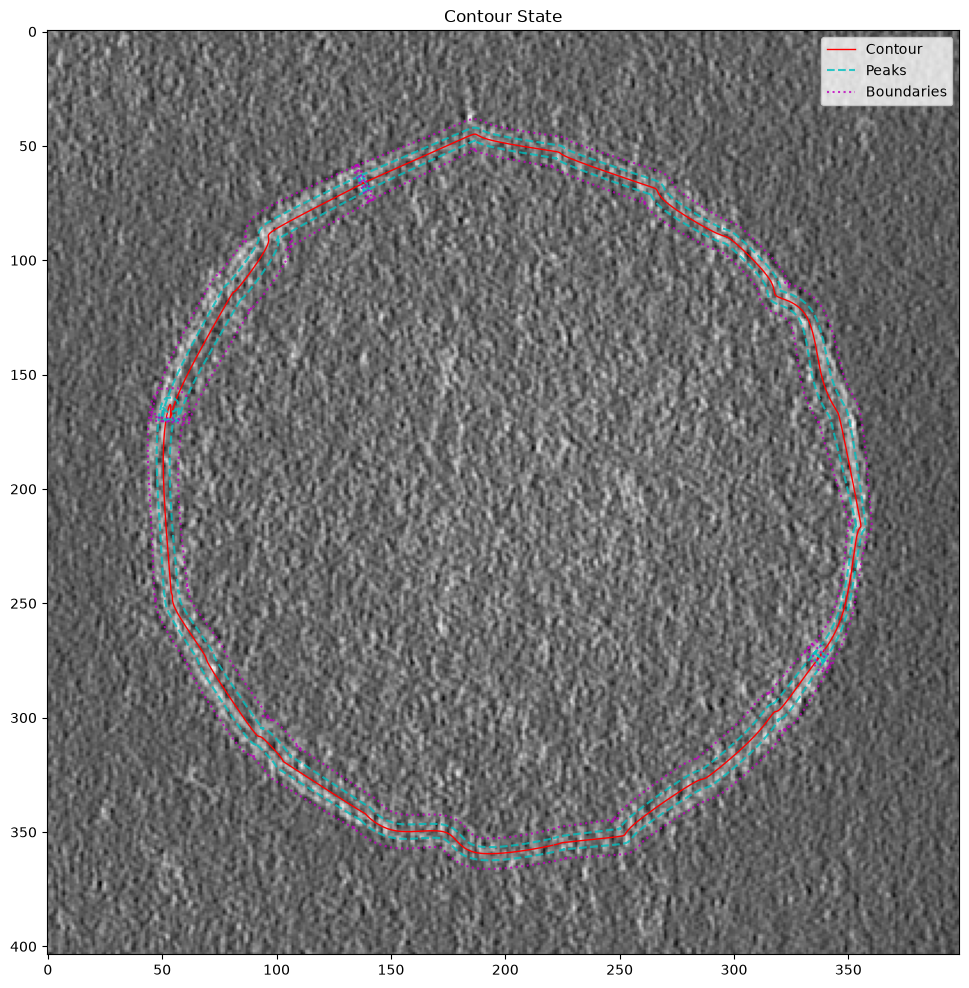

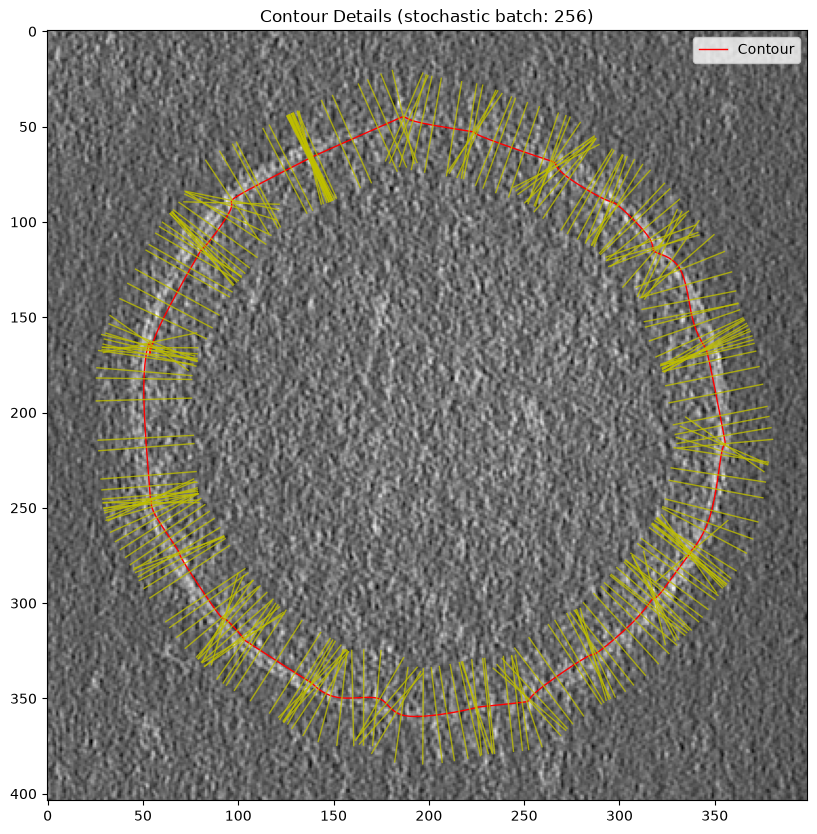

In [ ]:

#### Random seed 1234
generator = debug.get_generator(device=device, manual_seed=1234, reset=True)
### First test is without the tangential and normal laplacian
props_dict = {
    "trial_id": "verify_5A",
    "refiner": "bspline",
    "template": "bspline",
    "symmetric": True,
    "reg_mode": "static",
    "w_laplacian": 0.0,
    "w_edge": 0.0,
    "w_normal": 0,
    "w_tangential": 0,
    "w_anchor": 0.0,
    "w_smooth_param": 0.0,
    "w_contour_anchor": 0.0,
    "shape_loss_weight": 0.1,
    "learning_rate": 1e-1,
    "smoothness_window_size": 5,
    "min_peak_ratio": 3.0,
    "num_cp": 60,
}

(
    trainer,
    run_dir,
    refiner_props,
    template_props,
    t_mode,
    image,
    init_contour,
    gt_contour,
    image_t,
    contour_t,
    gt_contour_t,
) = create_trainer_with_config(props_dict=props_dict, output_subdir_name="cp_60_no_regs")
trainer.fit(20000)

display(trainer.plot_image())
pprint(trainer.trainer.logger.history[-1])
fig = trainer.plot_metrics()
display(fig)


# Evaluate
final_contour = trainer.refiner.contour.detach().cpu().numpy()

# Check for NaNs or explosion
if np.isnan(final_contour).any() or np.max(np.abs(final_contour)) > max(image.shape) * 2:
    chamfer = np.inf


metrics_from_init = hps.compute_contour_metrics(trainer.refiner.contour, contour_t)
chamfer_from_init = metrics_from_init["mean_dist"]
print("Chamfer from init", chamfer_from_init)
tmp_coords = trainer.refiner.contour
tmp_coords = tmp_coords.detach().cpu()
template_params = trainer.refiner.template_model.get_params(coordinates=tmp_coords)
(
    template_params["peak_dist"].mean(),
    template_params["peak_dist"].std(),
    template_params["sigma1"].mean(),
    template_params["sigma1"].std(),
)

mean_peak_dist = template_params["peak_dist"].detach().numpy().mean()
mean_sigma1 = template_params["sigma1"].detach().numpy().mean()
mean_sigma2 = template_params["sigma2"].detach().numpy().mean()

print(
    f"Mean Peak Dist: {mean_peak_dist:.2f}, Mean Sigma1: {mean_sigma1:.2f}, Mean Sigma2: {mean_sigma2:.2f}"
)
print(f"Original Peak Dist: {template_props.peak_dist} Original Sigma1: {template_props.sigma}")

plt.plot(template_params["peak_dist"].detach().numpy())
plt.plot(template_params["sigma1"].detach().numpy())
plt.axhline(
    y=mean_peak_dist,
    color="b",
    linestyle="dashed",
)
plt.axhline(
    y=mean_sigma1,
    color="g",
    linestyle="dashed",
)
plt.show()
tmp_profiles, *_ = trainer.refiner.sample_image_features(image_t)
tmp_profiles = tmp_profiles.detach()
trainer.refiner.visualize_profile_statistics(image_t.cpu())
plt.show()
trainer.refiner.visualize_contour(image_t.detach())
vis.plot_contour_normals(image_t, tmp_coords.detach().numpy())
plt.show()

#### Significantly worse!

#### Next setting number of control points to 60, 1.0 smoothing parameter


2026-07-15 16:49:10,248 - INFO - Resetting generator.
2026-07-15 16:49:10,249 - INFO - Creating new generator with seed 1234 on device cpu.
2026-07-15 16:49:10,250 - INFO - Loading dataset from ../data/2d_training_data_perturbations.pkl
2026-07-15 16:49:10,252 - INFO - Used params: ['learning_rate', 'min_peak_ratio', 'num_cp', 'refiner', 'reg_mode', 'shape_loss_weight', 'smoothness_window_size', 'symmetric', 'template', 'trial_id', 'w_anchor', 'w_contour_anchor', 'w_edge', 'w_laplacian', 'w_normal', 'w_smooth_param', 'w_tangential']
2026-07-15 16:49:10,252 - INFO - Unused params: []
2026-07-15 16:49:10,255 - INFO - Creating template model: bspline
2026-07-15 16:49:10,256 - INFO - Initializing ContourLoss
2026-07-15 16:49:10,257 - INFO - Initializing BSplineContourRefiner with 60 control points, 1237 eval points.
2026-07-15 16:49:10,259 - INFO - Output directory set to: ../output/verification_test_5A/bspline/cp_60_no_regs/2026-07-15_16-49-10
GPU available: True (mps), used: False
TPU av

Default params:
BSplineContourRefinerProps(num_steps=2000,
                           learning_rate=0.1,
                           initial_regularization_weights={'anchor_amp_ratio': 0.0,
                                                           'anchor_sigma_ratio': 0.0,
                                                           'contour_anchor': 0.0,
                                                           'contour_laplacian': 0.0,
                                                           'edge_length': 0.0,
                                                           'normal_consistency': 0,
                                                           'smooth_amp_ratio': 1.0,
                                                           'smooth_peak_dist': 1.0,
                                                           'smooth_sigma': 1.0,
                                                           'smooth_sigma_ratio': 1.0,
                                                           't

2026-07-15 16:50:40,804 - INFO - Final state saved to ../output/verification_test_5A/bspline/cp_60_no_regs/2026-07-15_16-49-10/final.pkl


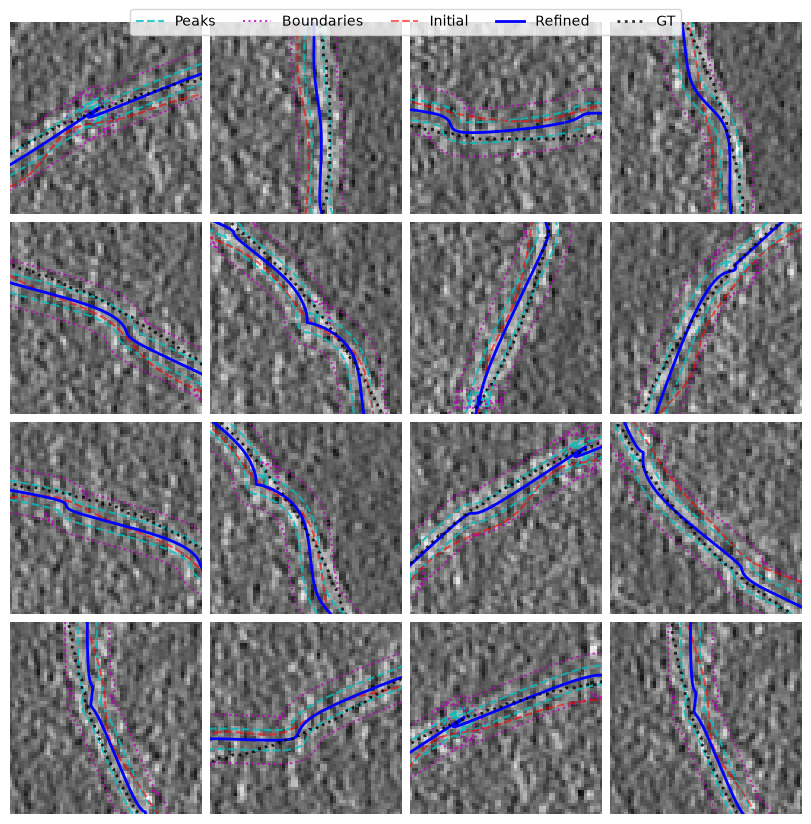

{'anchor_amp_ratio_loss': 0.0,
 'anchor_peak_dist_loss': 0.0,
 'anchor_sigma_loss': 0.0,
 'anchor_sigma_ratio_loss': 0.0,
 'contour_anchor_loss': 0.0,
 'contour_laplacian_loss': 0.0,
 'correlation_loss': 0.5036316514015198,
 'data_loss': 0.5216313004493713,
 'edge_length_loss': 0.0,
 'epoch': 0,
 'mean_dist': 2.0985960960388184,
 'normal_consistency_loss': 0.0,
 'rbf_weight_decay_loss': 0.0,
 'shape_loss': 0.017999645322561264,
 'smooth_amp_ratio_loss': 0.0,
 'smooth_peak_dist_loss': 2.306628812220879e-05,
 'smooth_sigma_loss': 0.0005677187582477927,
 'smooth_sigma_ratio_loss': 0.0,
 'step': 19999,
 'tangential_laplacian_loss': 0.0,
 'total_loss': 0.522222101688385}


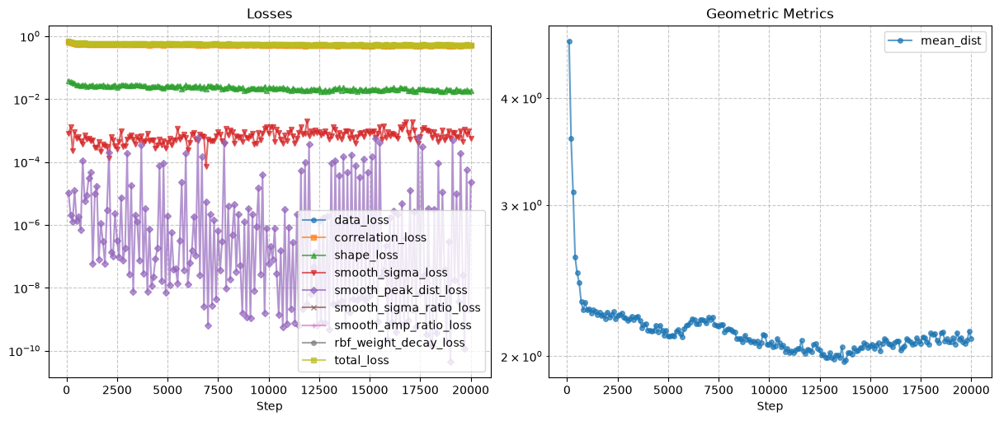

Chamfer from init 3.066584825515747
Mean Peak Dist: 6.06, Mean Sigma1: 2.02, Mean Sigma2: 2.02
Original Peak Dist: 4.0 Original Sigma1: 0.75


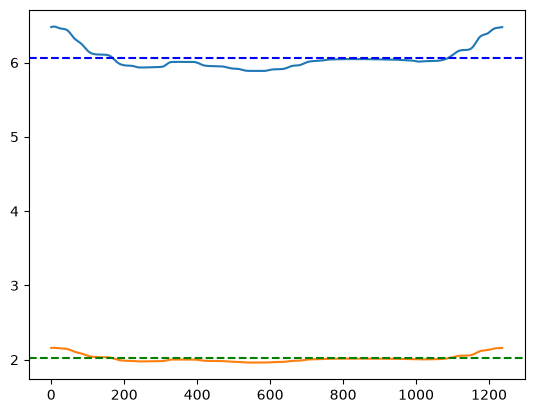

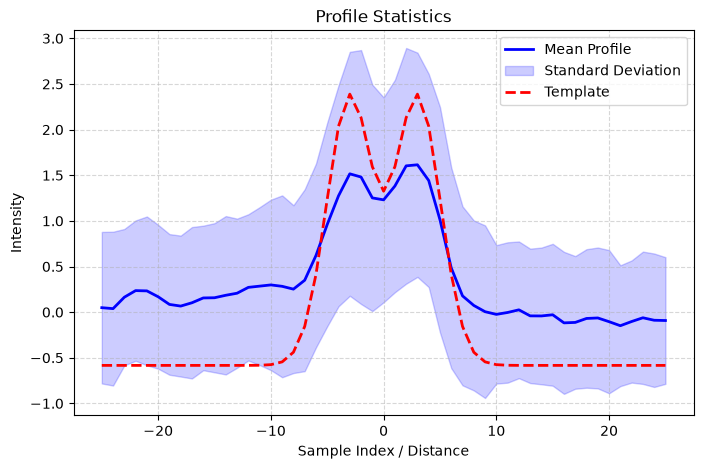

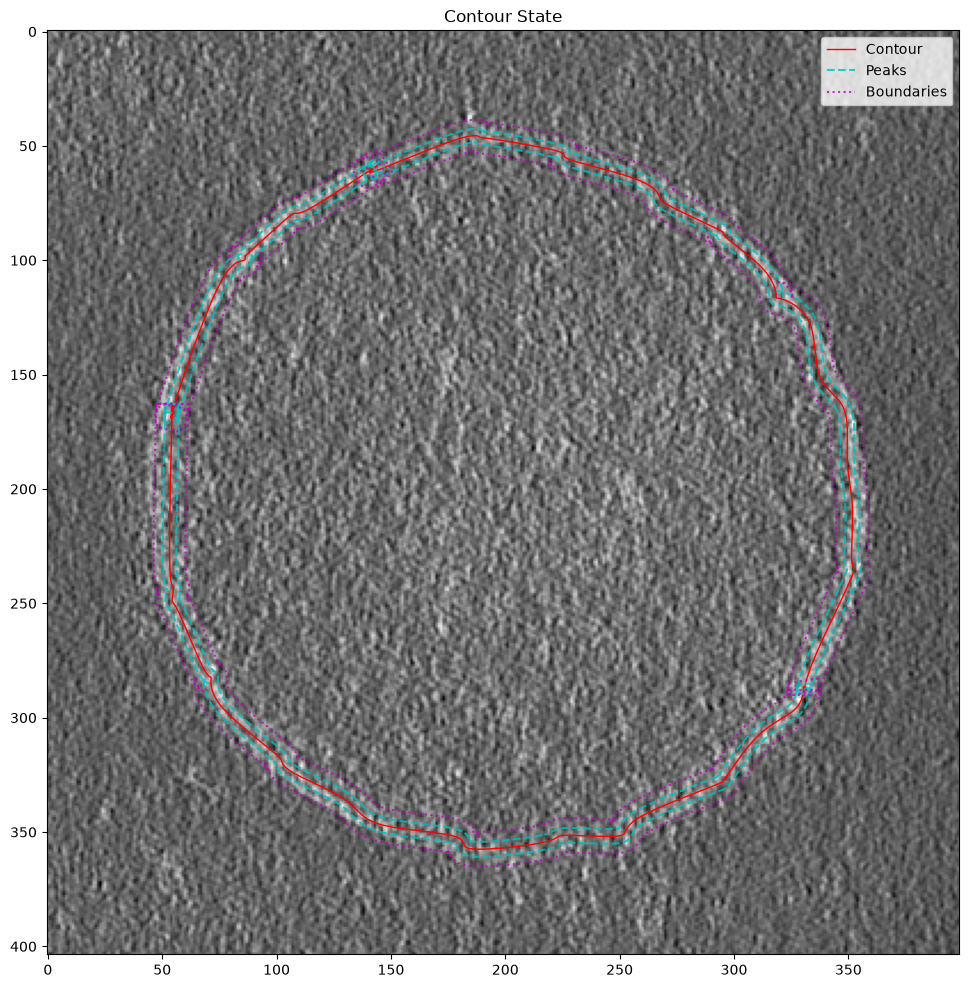

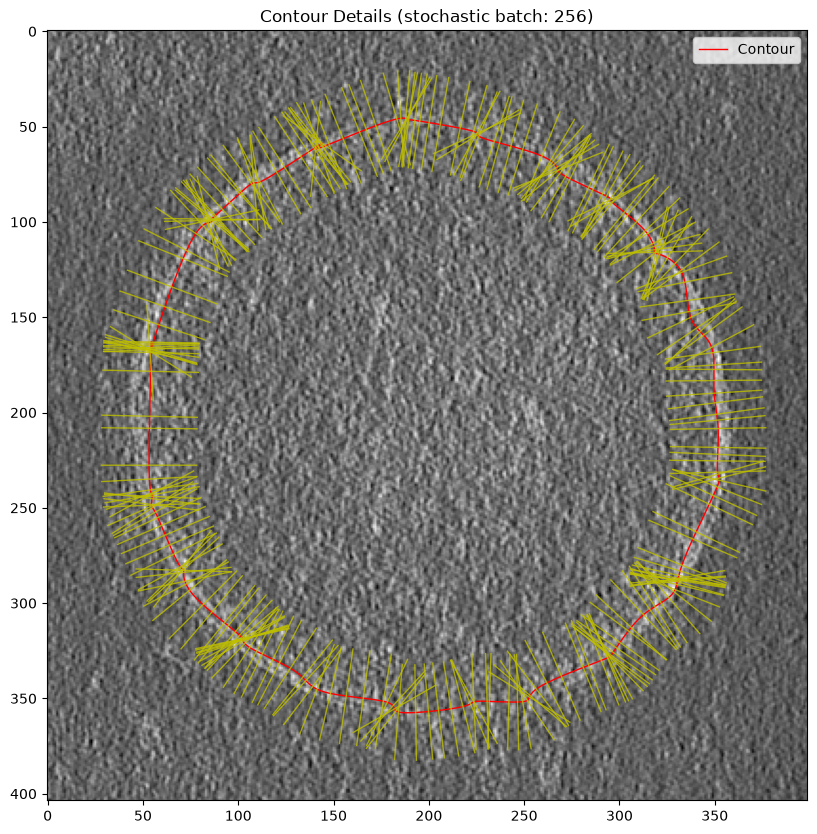

In [18]:
#### Random seed 1234
generator = debug.get_generator(device=device, manual_seed=1234, reset=True)
### First test is without the tangential and normal laplacian
props_dict = {
    "trial_id": "verify_5A",
    "refiner": "bspline",
    "template": "bspline",
    "symmetric": True,
    "reg_mode": "static",
    "w_laplacian": 0.0,
    "w_edge": 0.0,
    "w_normal": 0,
    "w_tangential": 0,
    "w_anchor": 0.0,
    "w_smooth_param": 1.0,
    "w_contour_anchor": 0.0,
    "shape_loss_weight": 0.1,
    "learning_rate": 1e-1,
    "smoothness_window_size": 5,
    "min_peak_ratio": 3.0,
    "num_cp": 60,
}

(
    trainer,
    run_dir,
    refiner_props,
    template_props,
    t_mode,
    image,
    init_contour,
    gt_contour,
    image_t,
    contour_t,
    gt_contour_t,
) = create_trainer_with_config(props_dict=props_dict, output_subdir_name="cp_60_no_regs")
trainer.fit(20000)

display(trainer.plot_image())
pprint(trainer.trainer.logger.history[-1])
fig = trainer.plot_metrics()
display(fig)


# Evaluate
final_contour = trainer.refiner.contour.detach().cpu().numpy()

# Check for NaNs or explosion
if np.isnan(final_contour).any() or np.max(np.abs(final_contour)) > max(image.shape) * 2:
    chamfer = np.inf


metrics_from_init = hps.compute_contour_metrics(trainer.refiner.contour, contour_t)
chamfer_from_init = metrics_from_init["mean_dist"]
print("Chamfer from init", chamfer_from_init)
tmp_coords = trainer.refiner.contour
tmp_coords = tmp_coords.detach().cpu()
template_params = trainer.refiner.template_model.get_params(coordinates=tmp_coords)
(
    template_params["peak_dist"].mean(),
    template_params["peak_dist"].std(),
    template_params["sigma1"].mean(),
    template_params["sigma1"].std(),
)

mean_peak_dist = template_params["peak_dist"].detach().numpy().mean()
mean_sigma1 = template_params["sigma1"].detach().numpy().mean()
mean_sigma2 = template_params["sigma2"].detach().numpy().mean()

print(
    f"Mean Peak Dist: {mean_peak_dist:.2f}, Mean Sigma1: {mean_sigma1:.2f}, Mean Sigma2: {mean_sigma2:.2f}"
)
print(f"Original Peak Dist: {template_props.peak_dist} Original Sigma1: {template_props.sigma}")

plt.plot(template_params["peak_dist"].detach().numpy())
plt.plot(template_params["sigma1"].detach().numpy())
plt.axhline(
    y=mean_peak_dist,
    color="b",
    linestyle="dashed",
)
plt.axhline(
    y=mean_sigma1,
    color="g",
    linestyle="dashed",
)
plt.show()
tmp_profiles, *_ = trainer.refiner.sample_image_features(image_t)
tmp_profiles = tmp_profiles.detach()
trainer.refiner.visualize_profile_statistics(image_t.cpu())
plt.show()
trainer.refiner.visualize_contour(image_t.detach())
vis.plot_contour_normals(image_t, tmp_coords.detach().numpy())
plt.show()

#### Doesn't work either. 

#### Try adding the other regularization --- normal fairing first 

2026-07-15 17:35:27,567 - INFO - Resetting generator.
2026-07-15 17:35:27,568 - INFO - Creating new generator with seed 1234 on device cpu.
2026-07-15 17:35:27,569 - INFO - Loading dataset from ../data/2d_training_data_perturbations.pkl
2026-07-15 17:35:27,571 - INFO - Used params: ['learning_rate', 'min_peak_ratio', 'num_cp', 'refiner', 'reg_mode', 'shape_loss_weight', 'smoothness_window_size', 'symmetric', 'template', 'trial_id', 'w_anchor', 'w_contour_anchor', 'w_edge', 'w_laplacian', 'w_normal', 'w_smooth_param', 'w_tangential']
2026-07-15 17:35:27,571 - INFO - Unused params: []
2026-07-15 17:35:27,574 - INFO - Creating template model: bspline
2026-07-15 17:35:27,574 - INFO - Initializing ContourLoss
2026-07-15 17:35:27,575 - INFO - Initializing BSplineContourRefiner with 60 control points, 1237 eval points.
2026-07-15 17:35:27,577 - INFO - Output directory set to: ../output/verification_test_5A/bspline/cp_60_no_regs/2026-07-15_17-35-27
GPU available: True (mps), used: False
TPU av

Default params:
BSplineContourRefinerProps(num_steps=2000,
                           learning_rate=0.1,
                           initial_regularization_weights={'anchor_amp_ratio': 0.0,
                                                           'anchor_sigma_ratio': 0.0,
                                                           'contour_anchor': 0.0,
                                                           'contour_laplacian': 0.0,
                                                           'edge_length': 0.0,
                                                           'normal_consistency': 5.0,
                                                           'smooth_amp_ratio': 0.5,
                                                           'smooth_peak_dist': 0.5,
                                                           'smooth_sigma': 0.5,
                                                           'smooth_sigma_ratio': 0.5,
                                                           

2026-07-15 17:36:58,600 - INFO - Final state saved to ../output/verification_test_5A/bspline/cp_60_no_regs/2026-07-15_17-35-27/final.pkl


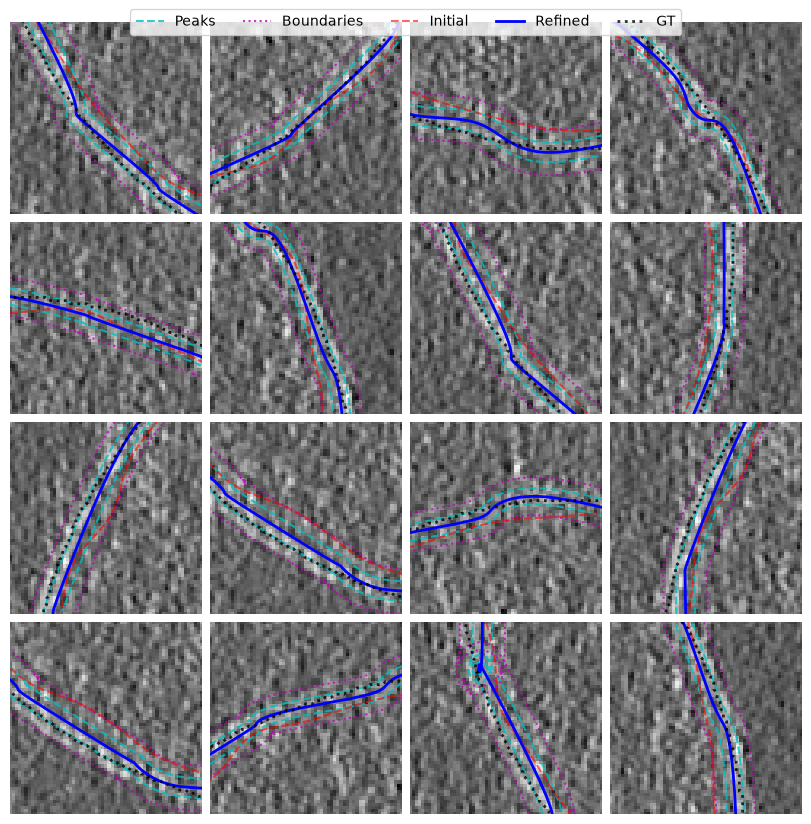

{'anchor_amp_ratio_loss': 0.0,
 'anchor_peak_dist_loss': 0.0,
 'anchor_sigma_loss': 0.0,
 'anchor_sigma_ratio_loss': 0.0,
 'contour_anchor_loss': 0.0,
 'contour_laplacian_loss': 0.0,
 'correlation_loss': 0.4968484044075012,
 'data_loss': 0.5213542580604553,
 'edge_length_loss': 0.0,
 'epoch': 0,
 'mean_dist': 1.7207051515579224,
 'normal_consistency_loss': 0.006390400230884552,
 'rbf_weight_decay_loss': 0.0,
 'shape_loss': 0.02450588159263134,
 'smooth_amp_ratio_loss': 0.0,
 'smooth_peak_dist_loss': 4.779167284141295e-09,
 'smooth_sigma_loss': 0.0007064227247610688,
 'smooth_sigma_ratio_loss': 0.0,
 'step': 19999,
 'tangential_laplacian_loss': 0.0,
 'total_loss': 0.5284510850906372}


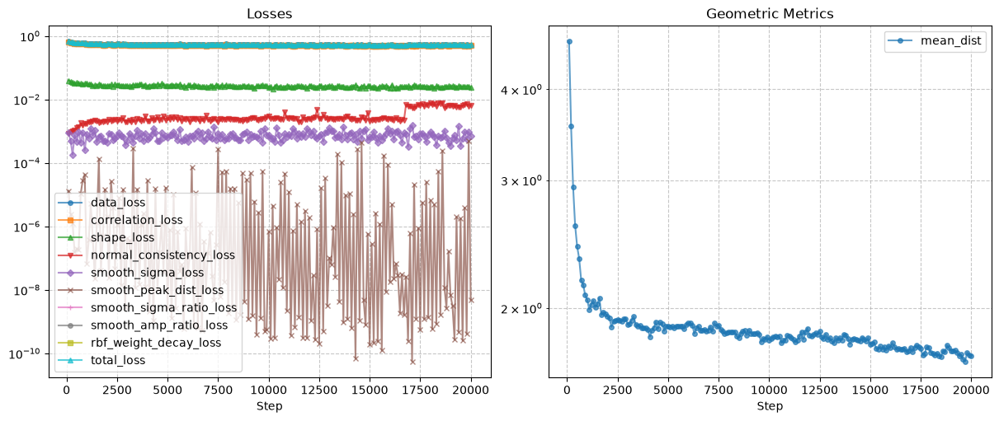

Chamfer from init 3.2020764350891113
Mean Peak Dist: 5.51, Mean Sigma1: 1.84, Mean Sigma2: 1.84
Original Peak Dist: 4.0 Original Sigma1: 0.75


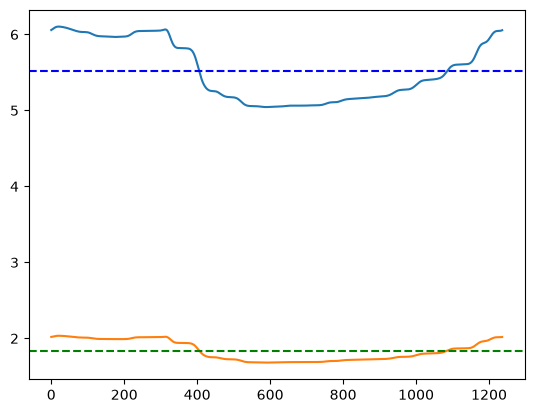

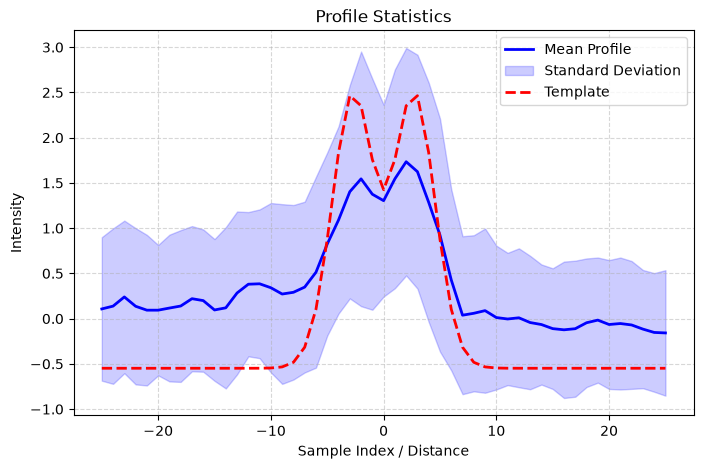

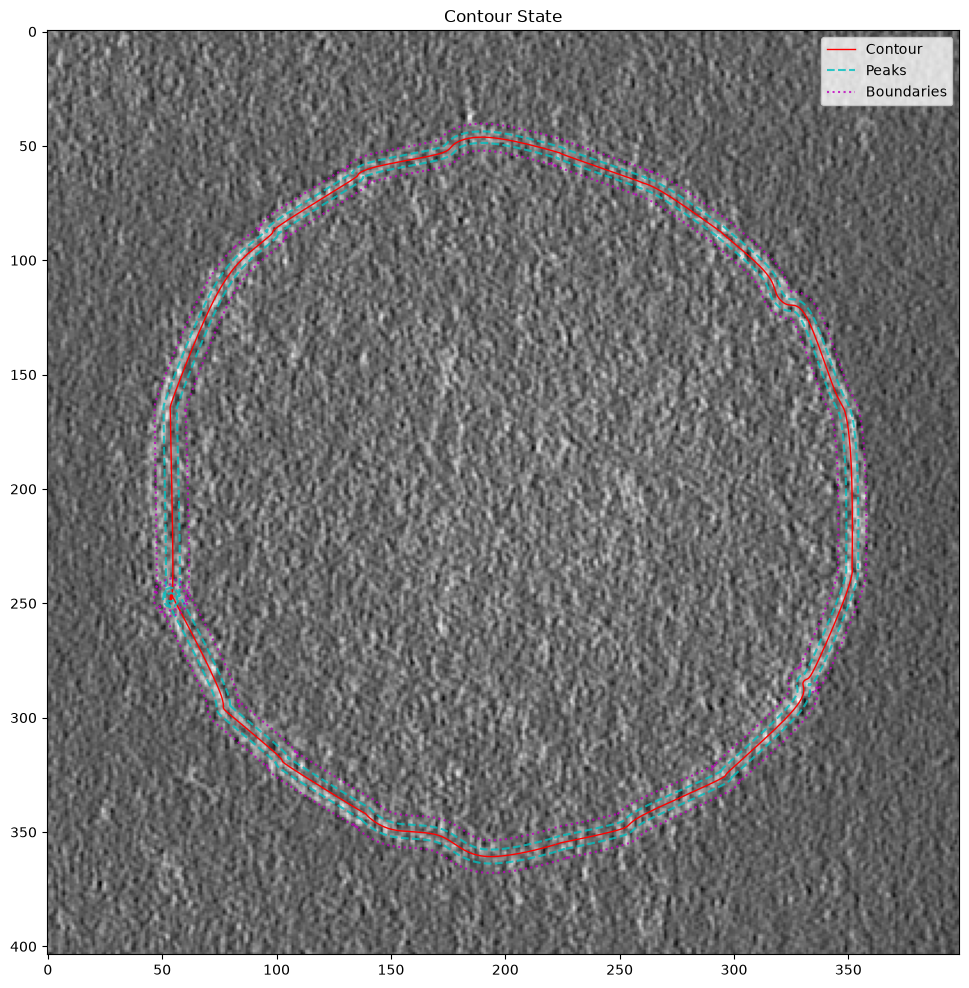

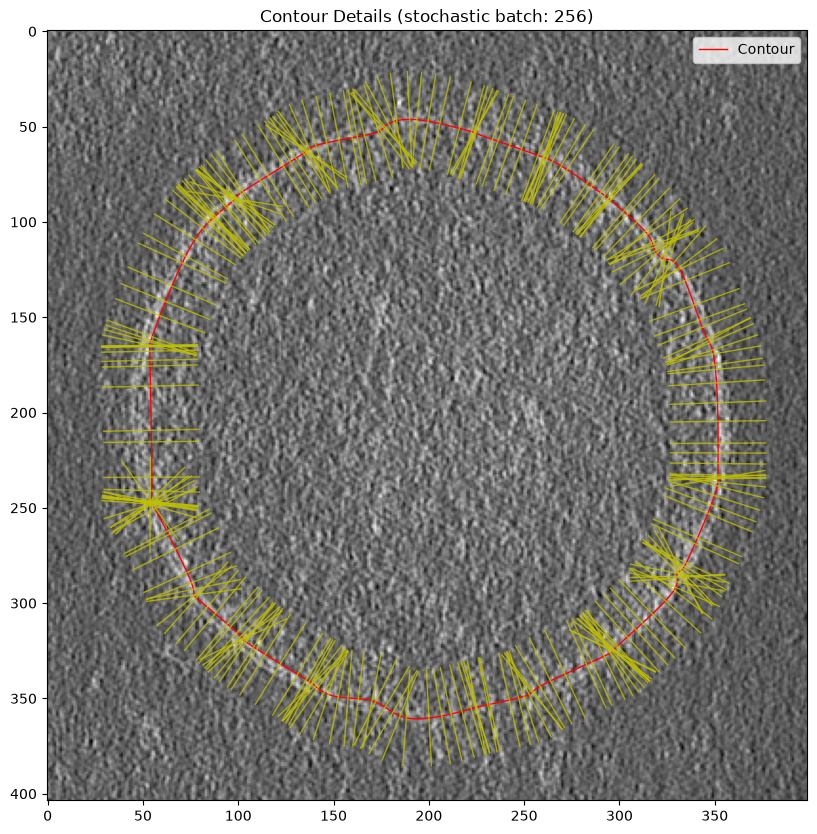

In [21]:
#### Random seed 1234
generator = debug.get_generator(device=device, manual_seed=1234, reset=True)
### First test is without the tangential and normal laplacian
props_dict = {
    "trial_id": "verify_5A",
    "refiner": "bspline",
    "template": "bspline",
    "symmetric": True,
    "reg_mode": "static",
    "w_laplacian": 0.0,
    "w_edge": 0.0,
    "w_normal": 5.0,
    "w_tangential": 0,
    "w_anchor": 0.0,
    "w_smooth_param": 0.5,
    "w_contour_anchor": 0.0,
    "shape_loss_weight": 0.1,
    "learning_rate": 1e-1,
    "smoothness_window_size": 5,
    "min_peak_ratio": 3.0,
    "num_cp": 60,
}

(
    trainer,
    run_dir,
    refiner_props,
    template_props,
    t_mode,
    image,
    init_contour,
    gt_contour,
    image_t,
    contour_t,
    gt_contour_t,
) = create_trainer_with_config(props_dict=props_dict, output_subdir_name="cp_60_no_regs")
trainer.fit(20000)

display(trainer.plot_image())
pprint(trainer.trainer.logger.history[-1])
fig = trainer.plot_metrics()
display(fig)


# Evaluate
final_contour = trainer.refiner.contour.detach().cpu().numpy()

# Check for NaNs or explosion
if np.isnan(final_contour).any() or np.max(np.abs(final_contour)) > max(image.shape) * 2:
    chamfer = np.inf


metrics_from_init = hps.compute_contour_metrics(trainer.refiner.contour, contour_t)
chamfer_from_init = metrics_from_init["mean_dist"]
print("Chamfer from init", chamfer_from_init)
tmp_coords = trainer.refiner.contour
tmp_coords = tmp_coords.detach().cpu()
template_params = trainer.refiner.template_model.get_params(coordinates=tmp_coords)
(
    template_params["peak_dist"].mean(),
    template_params["peak_dist"].std(),
    template_params["sigma1"].mean(),
    template_params["sigma1"].std(),
)

mean_peak_dist = template_params["peak_dist"].detach().numpy().mean()
mean_sigma1 = template_params["sigma1"].detach().numpy().mean()
mean_sigma2 = template_params["sigma2"].detach().numpy().mean()

print(
    f"Mean Peak Dist: {mean_peak_dist:.2f}, Mean Sigma1: {mean_sigma1:.2f}, Mean Sigma2: {mean_sigma2:.2f}"
)
print(f"Original Peak Dist: {template_props.peak_dist} Original Sigma1: {template_props.sigma}")

plt.plot(template_params["peak_dist"].detach().numpy())
plt.plot(template_params["sigma1"].detach().numpy())
plt.axhline(
    y=mean_peak_dist,
    color="b",
    linestyle="dashed",
)
plt.axhline(
    y=mean_sigma1,
    color="g",
    linestyle="dashed",
)
plt.show()
tmp_profiles, *_ = trainer.refiner.sample_image_features(image_t)
tmp_profiles = tmp_profiles.detach()
trainer.refiner.visualize_profile_statistics(image_t.cpu())
plt.show()
trainer.refiner.visualize_contour(image_t.detach())
vis.plot_contour_normals(image_t, tmp_coords.detach().numpy())
plt.show()